# **Mapping and Perception for an autonomous robot (0510-7951)**

#Exercise 3:
---
**Iterative Closest Point**

In this section you will implement the algorithm of Iterative Closest Point (ICP) on 2 point clouds from the KITTI dataset and analyze the results.
You will use K-D Tree vs. Nearest Neighbors for data assosiations, and compare the results.

KITTI dataset [**Robotic kit components**](https://www.cvlibs.net/datasets/kitti/) and [**pykitti tool**](https://pypi.org/project/pykitti/)

-------------------------------------

**Instructions**

1. Fill in the code the "TODO" section

2. **Please copy all the results to the report:**
  - Outputs- Images, tables, scores,etc
  - Performace, analysis and your explanations.
  - Attach the completed notebook to the report package.
3. Download and extract project data to your Google Drive

  1.   Install Google Drive on your desktop.
  2.   Save this notebook to your Google Drive by clicking `Save a copy in Drive` from the `File` menu.
  3. Go to [**KITTI dataset**](http://www.cvlibs.net/datasets/kitti/) ,and download your specific records (chose "sync" recording)
  5. Load the record to you goole drive account. Mount the recorcds to the notebook.
  6. The git include example of records ('0117'), you can use it to learn how to arrange the format folders for pykitti toolbox.

Good luck!

###REFERENCES

[1] The full KITTI datased can be accessed here: http://www.cvlibs.net/datasets/kitti/.

[2] KITTI Dataset paper: A. Geiger, P. Lenz, C. Stiller and R. Urtasun, "Vision meets Robotics: The KITTI Dataset," International Journal of Robotics Research (IJRR), vol. 32, no. 11, pp. 1231-1237 2013.

[3] This tutorial use pykitti module to load the KITTI dataset: https://github.com/utiasSTARS/pykitti.

In [1]:
#TODO#

# Name of student: Nimrod Curtis
# ID: 311230924

In [2]:
## To import google drive, write this code in code section of colab and run it
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


# Preparation

In [3]:
# First- install pykitti
!pip install pykitti
!pip install -U kaleido

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 17.1 MB/s eta 0:00:00


In [4]:
# import ome imporatnt packages
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import pykitti
from sklearn.neighbors import KDTree, NearestNeighbors
import plotly.graph_objects as go
import time

Load your data

In [5]:
!git clone https://github.com/orfaig/course_ex1.git

Cloning into 'course_ex1'...
remote: Enumerating objects: 1351, done.
remote: Counting objects: 100% (2/2), done.
remote: Total 1351 (delta 1), reused 1 (delta 1), pack-reused 1349
Receiving objects: 100% (1351/1351), 471.51 MiB | 29.04 MiB/s, done.
Resolving deltas: 100% (27/27), done.
Updating files: 100% (1166/1166), done.


In [6]:
### Load KITTI Data

#directly from colab
basedir = 'course_ex1/raw_data/'
date = '2011_09_26'
drive = '0117'
frame_A = 5
frame_B = 9

In [7]:
#read the data using pykitti

data = pykitti.raw(basedir, date, drive)

Set the results directory for the figures

In [8]:
fig_dir_path = os.getcwd() + "/Results/"
if not os.path.exists(fig_dir_path):
    os.makedirs(fig_dir_path)

# Infrastructure
Plot the Data functions

### Plot the errors on a graph

In [9]:
def plot_errors(errors, title):
  plt.figure()
  plt.title("ICP Error of {} vs Iterations".format(title))
  plt.plot(range(1, 1+len(errors)), errors)
  plt.xlabel("Iteration [a.u.]")
  plt.ylabel("Error [m]")
  plt.savefig(fig_dir_path+'/'+"ICP {}.png".format(title))

### Visualize 2 point clouds, and save the figure as png

In [10]:
palette = ['#FF1493', '#afd6fa']

def visualize_clouds(clouds, fname):
  data = []
  for i, cloud in enumerate(clouds):
      xdata = cloud[:, 0]
      ydata = cloud[:, 1]
      zdata = cloud[:, 2]

      data.append(go.Scatter3d(x=xdata, y=ydata, z=zdata,
          mode='markers',
          marker=dict(
              size=1,
              color=palette[i],
              opacity=1.0
          ))
      )

  # Decide bounds
  mega_cloud = np.vstack(clouds)
  mega_centroid = np.average(mega_cloud, axis=0)
  mega_max = np.amax(mega_cloud, axis=0)
  mega_min = np.amin(mega_cloud, axis=0)
  lower_bound = mega_centroid - (np.amax(mega_max - mega_min) / 2)
  upper_bound = mega_centroid + (np.amax(mega_max - mega_min) / 2)

  # Setup layout
  grid_lines_color = 'rgb(127, 127, 127)'
  layout = go.Layout(
      scene=dict(
          xaxis=dict(nticks=8,
                  range=[lower_bound[0], upper_bound[0]],
                  showbackground=True,
                  backgroundcolor='rgb(30, 30, 30)',
                  gridcolor=grid_lines_color,
                  zerolinecolor=grid_lines_color),
          yaxis=dict(nticks=8,
                  range=[lower_bound[1], upper_bound[1]],
                  showbackground=True,
                  backgroundcolor='rgb(30, 30, 30)',
                  gridcolor=grid_lines_color,
                  zerolinecolor=grid_lines_color),
          zaxis=dict(nticks=8,
                  range=[lower_bound[2], upper_bound[2]],
                  showbackground=True,
                  backgroundcolor='rgb(30, 30, 30)',
                  gridcolor=grid_lines_color,
                  zerolinecolor=grid_lines_color),
          xaxis_title="x (meters)",
          yaxis_title="y (meters)",
          zaxis_title="z (meters)"
      ),
      margin=dict(r=10, l=10, b=10, t=10),
      paper_bgcolor='rgb(30, 30, 30)',
      font=dict(
          family="Courier New, monospace",
          color=grid_lines_color
      ),
      legend=dict(
          font=dict(
              family="Courier New, monospace",
              color='rgb(127, 127, 127)'
          )
      )
  )

  fig = go.Figure(data=data, layout=layout)
  fig.write_image(fig_dir_path+'/'+"{}.png".format(fname))
  fig.show()


### Generate an animation

* insert pc_A = static point cloud
* insert pc_B_list = list of point clouds which change in each iteration



Visualize the animation with Start and end buttons

Save the animation as html

**NOTE:** due to browser limitation, we subsample the point clouds before animating.

In [11]:
def visualize_clouds_animation(pc_A, pc_B_list, fname, speed=100):
  # Setup data
  iteration_labels = [str(i) for i in range(len(pc_B_list))]
  all_clouds = []
  frames = []
  num_samples = min(pc_A.shape[0], pc_B_list[0].shape[0])
  subset_indices = np.random.choice(num_samples,
                                int(num_samples / (len(pc_B_list) * 0.5)),
                                replace=False)
  for i, (label, pc_B) in enumerate(zip(iteration_labels, pc_B_list)):
      data = []
      clouds = [pc_A, pc_B]
      for j, pc in enumerate(clouds):
        xdata = pc[subset_indices, 0]
        ydata = pc[subset_indices, 1]
        zdata = pc[subset_indices, 2]

        data.append(go.Scatter3d(x=xdata, y=ydata, z=zdata,
            mode='markers',
            marker=dict(
                size=1,
                color=palette[j],
                opacity=1.0
            ))
        )
      frames.append(go.Frame(name=label, data=data))
      all_clouds += clouds
      if i == 0:
          first_data = data

  # Decide bounds
  mega_cloud = np.vstack(all_clouds)
  mega_centroid = np.average(mega_cloud, axis=1)
  mega_max = np.amax(mega_cloud, axis=1)
  mega_min = np.amin(mega_cloud, axis=1)
  lower_bound = mega_centroid - (np.amax(mega_max - mega_min) / 2)
  upper_bound = mega_centroid + (np.amax(mega_max - mega_min) / 2)

  # Setup layout
  grid_lines_color = 'rgb(127, 127, 127)'
  layout = go.Layout(
      scene=dict(
          xaxis=dict(nticks=8,
                  range=[lower_bound[0], upper_bound[0]],
                  showbackground=True,
                  backgroundcolor='rgb(30, 30, 30)',
                  gridcolor=grid_lines_color,
                  zerolinecolor=grid_lines_color),
          yaxis=dict(nticks=8,
                  range=[lower_bound[1], upper_bound[1]],
                  showbackground=True,
                  backgroundcolor='rgb(30, 30, 30)',
                  gridcolor=grid_lines_color,
                  zerolinecolor=grid_lines_color),
          zaxis=dict(nticks=8,
                  range=[lower_bound[2], upper_bound[2]],
                  showbackground=True,
                  backgroundcolor='rgb(30, 30, 30)',
                  gridcolor=grid_lines_color,
                  zerolinecolor=grid_lines_color),
          xaxis_title="x (meters)",
          yaxis_title="y (meters)",
          zaxis_title="z (meters)"
      ),
      hovermode=False,
      margin=dict(r=10, l=10, b=10, t=10),
      paper_bgcolor='rgb(30, 30, 30)',
      font=dict(
          family="Courier New, monospace",
          color=grid_lines_color
      ),
      sliders=[dict(
          active=0,
          yanchor="top",
          xanchor="left",
          currentvalue=dict(
              font=dict(
                  family="Courier New, monospace",
                  color='rgb(30, 30, 30)'
              ),
              prefix="Step ",
              visible=True,
              xanchor="right"
          ),
          pad=dict(b=10, t=0),
          len=0.95,
          x=0.05,
          y=0,
          font=dict(
              family="Courier New, monospace",
              color='rgb(127, 127, 127)'
          ),
          steps=[dict(
                  args=[[iteration_label], dict(
                      frame=dict(duration=speed),
                      mode="immediate"
                  )],
                  label=iteration_label,
                  method="animate") for iteration_label in iteration_labels]
      )],
      updatemenus=[dict(
          buttons=[dict(
              args=[None, dict(
                  frame=dict(duration=speed),
                  fromcurrent=True
              )],
              label="Play",
              method="animate"
          )],
          direction="left",
          pad=dict(r=10, t=30),
          showactive=False,
          type="buttons",
          x=0.05,
          xanchor="right",
          y=0,
          yanchor="top",
          font=dict(
              family="Courier New, monospace",
              color='rgb(127, 127, 127)'
          )
      )],
      legend=dict(
          font=dict(
              family="Courier New, monospace",
              color='rgb(127, 127, 127)'
          )
      )
  )

  fig = go.Figure(data=first_data, layout=layout, frames=frames)
  fig.write_html(fig_dir_path+'/'+"{}.html".format(fname))
  fig.show()


### Show the final results:


*   Show the number of iterations
*   Show the final error
*   Plot the errors as function of iterations
*   Visualize and save the clouds in an animation



In [12]:
def show_results(i, errors, pc_A, pc_B_list,R,T, title):
  # Print results
  print("ICP of {} run for {} iterations".format(title, i))
  print("Final Error is: {:.3f} [m]".format(errors[-1]))
  # show R+T
  print("ICP results: R:{} , T: {}".format(R,T))

  # Plot errors
  plot_errors(errors, title)

  # show animation
  visualize_clouds_animation(pc_A, pc_B_list, title)



# Display the data

## Load the point clouds

We will use 2 scans from 2 different frames:
* pc_A = {a_i}
* pc_B = {b_i}


In [13]:
def get_pc(data, idx):
  return data.get_velo(idx)[:,:3];


# Load Point Clouds from dataset
pc_A = get_pc(data, frame_A)
pc_B = get_pc(data, frame_B)


In [14]:
def load_image(data,idx):
  ### Get the image data

  img_raw= data.get_cam2(idx) #TODO (hint- use get_cam2 in pykitti)

  return img_raw

Image_A = load_image(data, frame_A)
Image_B = load_image(data, frame_B)

## Visualize the Point Clouds & Images

In [15]:
# choose the point clouds to visualize, by inserting to a list
clouds = [pc_A, pc_B] # TODO

# visualize
visualize_clouds(clouds, 'FullP- Before_ICPC')

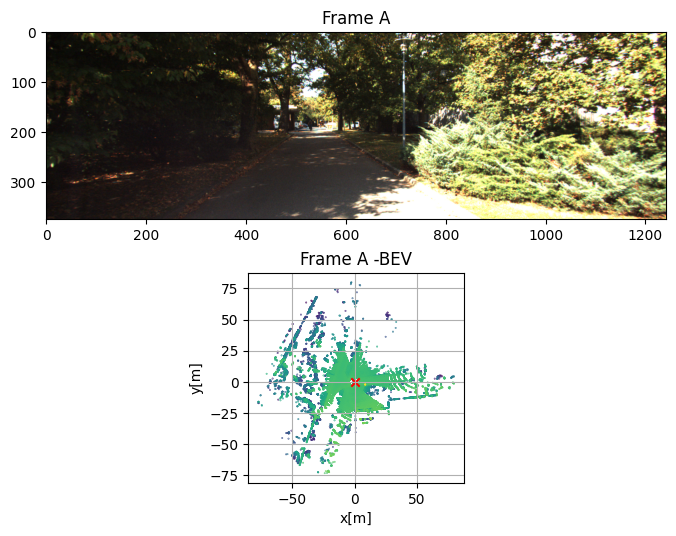

In [16]:
fig,axs = plt.subplots(2,1,figsize=(8,6))
axs[0].set_title("Frame A")
axs[0].imshow(Image_A)
axs[1].scatter(pc_A[:,0],pc_A[:,1],c=-pc_A[:,2],marker='.',s=0.5)
axs[1].scatter(0,0,c='r',marker='x')
axs[1].set_title("Frame A -BEV")
axs[1].set_xlim( -30 ,30)
axs[1].set_ylim( -30 ,30)
axs[1].axis('scaled')
axs[1].grid()
axs[1].set_xlabel('x[m]')
axs[1].set_ylabel('y[m]')
plt.show()

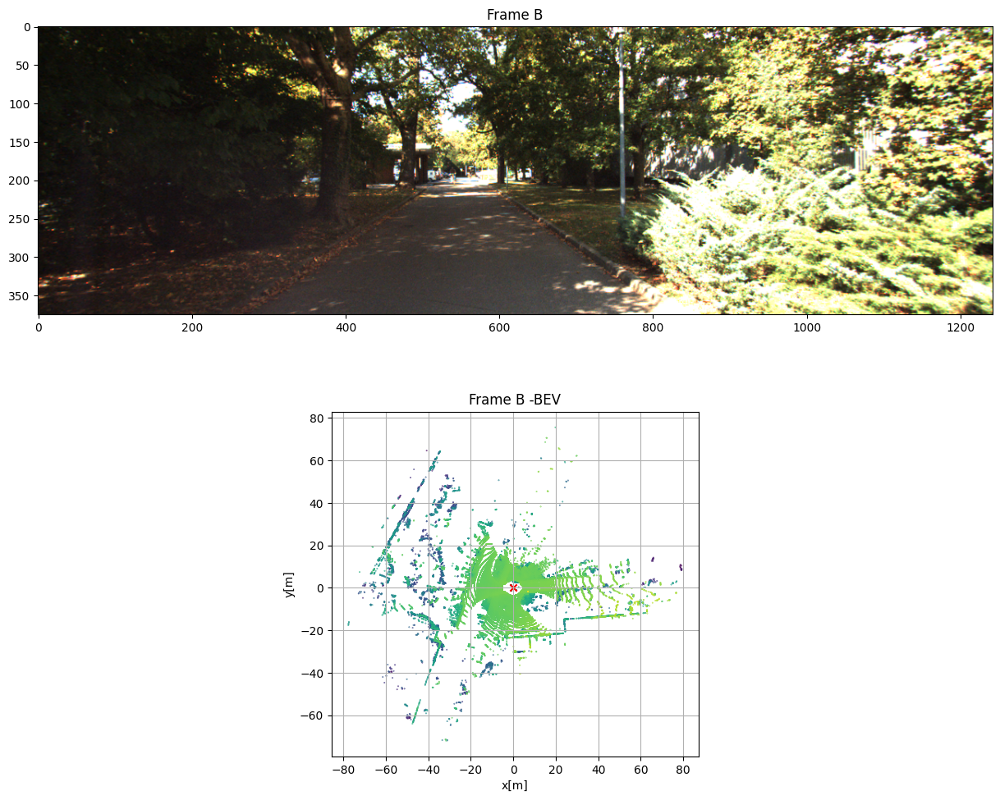

In [17]:
fig,axs = plt.subplots(2,1,figsize=(15,12))
axs[0].set_title("Frame B")
axs[0].imshow(Image_B)
axs[1].scatter(pc_B[:,0],pc_B[:,1],c=-pc_B[:,2],marker='.',s=0.5)
axs[1].scatter(0,0,c='r',marker='x')
axs[1].set_title("Frame B -BEV")
axs[1].set_xlim( -30 ,30)
axs[1].set_ylim( -30 ,30)
axs[1].axis('scaled')
axs[1].grid()
axs[1].set_xlabel('x[m]')
axs[1].set_ylabel('y[m]')
plt.show()

# ICP implementation

Applying the vanilla Iterative Closest Points (ICP) algorithm to all point clouds without any additional changes or variations using K-DTree

As was learned in the lectures, the ICP algorithm needs

1.   Find correspondences, i.e. the assign closest points as pairs.
2.   Estimate the transformation via SVD (singular value decomposition).



## 1. Data Association - K-D Tree

K-D Tree is an algorithm which allows us a useful multi-dimensional search.

K-D Tree holds a space-partitioning data structure for orginizing the points in a k-dimensional space.

information about K-D Tree: https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KDTree.html

In [18]:
def assign_closest_pairs_kdtree(pc_A, pc_B):
  """Assign closest points into pairs of point clouds A and B via K-D Tree
  return the indices of point cloud B."""

  # create K-D Tree
  tree = KDTree(pc_B,leaf_size=120) # TODO: use KDTREE function

  # find the indices of point cloud B which are closest to point cloud A
  # use query function, and return only 1 nearest neighbor.
  dist, indices = tree.query(pc_A, k=1)  #TODO (use hint: tree.query)

  return indices.ravel(),tree, dist.squeeze()

## 2. Estimate transformation via SVD (Singular Value Decomposition)

We will use SVD to estimate the Rotation matrix **R**, and translation vector **t**.

In [19]:
def estimate_transform(pc_A, pc_B):
  """Estimate the transformation from point cloud B to A using SVD.
  Find rotation matrix R and translation vector t.
  Calculate the error"""

  # shift point clouds to the center
  mean_A = np.mean(pc_A, axis=0)
  mean_B = np.mean(pc_B, axis=0)

  # center point clouds
  centered_pc_A = pc_A - mean_A
  centered_pc_B = pc_B - mean_B

  # apply SVD
  W = (centered_pc_B.T).dot(centered_pc_A)
  U, S, V_T = np.linalg.svd(W)

  # calculate rotation and translation matrices
  R = np.dot(V_T.T, U.T)
  t = mean_A - np.dot(R, mean_B)

  return R, t

## 3. ICP - Main Routine

Transformation functions - applying rotation matrix R and translation vector t

In [20]:
def transform_pc(R, t, pc):
  """Apply R and t on PC"""
  transformed_pc = np.dot(R, pc.T).T + t
  return transformed_pc

def update_total_transformation(R, t, curr_R, curr_t):
  "update rotation and translation matrices"
  tot_R = R.dot(curr_R) # TODO
  tot_t = (R.dot(curr_t.T)).T + t # TODO
  return tot_R, tot_t

K-DREE: Analysis of the NN assign closest pairs

In [21]:
indices,_,_= assign_closest_pairs_kdtree(pc_A, pc_B) # TODO
pc_target = pc_A
pc_source = pc_B[indices,:]


In [ ]:
# choose the point clouds to visualize, by inserting to a list
clouds = [pc_B,pc_source]

# visualize
visualize_clouds(clouds, 'Full_PC_NearestNeighbors')

ICP main routine, complete the code

In [ ]:
def calculate_rmse(dist):
    """Calculate the Root Mean Square Error (RMSE) between two point clouds based on the distance array"""
    mean_squared_error = np.mean(dist**2)
    rmse = np.sqrt(mean_squared_error)

    return rmse

In [ ]:
converge_th = 0.001
max_iters = 50

def icp(pc_A, pc_B, assign_closest_pairs_func):
  "Iterative closest point algorithm main routine"
  # copy pc of B
  curr_pc_B = pc_B.copy()
  pcs_B_for_animation = [curr_pc_B.copy()]

  # initialize total transformation
  R_total = np.eye(3) # TODO
  t_total = np.ones(3) # TODO

  # init errors
  prev_err = np.inf
  errors = []
  # iterative process
  for i in range(1, max_iters):
    # determine correspondance
    indices,tree,dist = assign_closest_pairs_func(pc_A, curr_pc_B) # TODO
    pc_target = pc_A
    pc_source = curr_pc_B[indices,:]
    # find transformation
    curr_R, curr_t = estimate_transform(pc_target,pc_source) # TODO
    # update current source
    curr_pc_B = transform_pc(curr_R, curr_t, curr_pc_B) # TODO , shift point coud B to A
    pcs_B_for_animation.append(curr_pc_B.copy()) # TODO

    # update total transformation
    R_total, t_total = update_total_transformation(R_total, t_total, curr_R, curr_t) # TODO // update R and t

    # Cacl RMSE
    curr_err = calculate_rmse(dist) #TODO

    # check error:

    errors.append(curr_err)
    if np.abs(prev_err - curr_err) < converge_th: # TODO // run ICP until R and T has not affect anymore
      break
    prev_err = curr_err

  return i, errors, pcs_B_for_animation, R_total, t_total

# Run vanilla ICP on full point cloud



Run ICP with K-D Tree function as the data associator

Show the results

In [ ]:

import time

#Start the timer
start_time = time.time()

# Run ICP
num_iters_kd, errors_kd, pc_B_kd, final_R, final_t = icp(pc_A, pc_B, assign_closest_pairs_kdtree)

# show results
show_results(num_iters_kd, errors_kd, pc_A, pc_B_kd,final_R, final_t, 'FullPC')

#Stop the timer
end_time = time.time()

#Calculate the elapsed time
elapsed_time_kdree = end_time - start_time

print("Elapsed time: {:.4f} seconds".format(elapsed_time_kdree))






In [ ]:
# show final results
clouds = [pc_A,pc_B_kd[-1]] # TODO

# visualize
visualize_clouds(clouds, 'ICP-Results')

# Run vanilla ICP on filtered point cloud
Implementaion of vanilla ICP of filtered point cloud using K-DREE

## Filter the point cloud above minimal height

In [ ]:
def filter_pc(pc, min_height = -1):
  "return filtered point cloud - only points above the minimal height"
  pc_filtered = pc.copy()
  indices = pc_filtered[:, 2] > min_height
  return pc_filtered[indices]

# filter point clouds
pc_f_A = filter_pc(pc_A)
pc_f_B = filter_pc(pc_B)

## Visualize the filtered Point Clouds

In [ ]:
# choose the point clouds to visualize, by inserting to a list
clouds = [pc_f_A, pc_f_B]

# visualize
# visualize_clouds(clouds,'FilteredPC- before_icp')

## Run ICP with the filtered point clouds

In [ ]:
max_dist=10
indices,tree,dist = assign_closest_pairs_kdtree(pc_f_A, pc_f_B)
dist = dist.squeeze()
pc_target_f = pc_f_A
pc_source_f = pc_f_B[indices,:]

In [ ]:
# choose the point clouds to visualize, by inserting to a list
clouds = [pc_f_B,pc_source_f]

# visualize
visualize_clouds(clouds, 'FilterPC-NearestNeighbors')

Run icp with K-D Tree function as the data associator

Show the results

In [ ]:

import time

#Start the timer
start_time = time.time()

# Run ICP
num_iters_kd_f, errors_kd_f, pc_B_kd_f, final_R_f, final_t_f= icp(pc_f_A, pc_f_B, assign_closest_pairs_kdtree)

#Stop the timer
end_time = time.time()

#Calculate the elapsed time
elapsed_time_kdree = end_time - start_time

print("Elapsed time: {:.4f} seconds".format(elapsed_time_kdree))

# show results
show_results(num_iters_kd_f, errors_kd_f, pc_f_A, pc_B_kd_f,final_R_f, final_t_f, 'with K-D Tree, filtered Point Cloud')


In [ ]:
# show final results
clouds = [pc_A,pc_B_kd_f[-1]]

# visualize
visualize_clouds(clouds, 'Filter_PC_ICP-Results')

# Run vanilla ICP on filtered point cloud using NN

## Data Association - Nearest Neighbors

K-Nearest Neeighbors is algorithm which allows us a useful multi-dimensional search.

information about K-NN: https://scikit-learn.org/stable/modules/neighbors.html

In [ ]:
def assign_closest_pairs_knn(pc_A, pc_B):
  """Assign closest points into pairs of point clouds A and B via nearest neighbor using K-D Tree fucntion
  return the indices of point cloud B."""

  # create K-D Tree
  tree = KDTree(pc_B,leaf_size=1) # TODO: use KDTREE function for Brute force (similar no NN), hint: change value of leaf_size parameter

  # find the indices of point cloud B which are closest to point cloud A
  # use query function, and return only 1 nearest neighbor.
  dist, indices = tree.query(X=pc_A,k=1) # TODO

  return indices.ravel(),tree,dist

## Run ICP with K-Nearest Neighbor

Run icp with K-NN function as the data associator

Show the results

In [ ]:
import time

#Start the timer
start_time = time.time()

# Run ICP
num_iters_knn, errors_knn, pc_B_knn, final_R_f_nn, final_t_f_nn= icp(pc_f_A, pc_f_B, assign_closest_pairs_knn)

#Stop the timer
end_time = time.time()

#Calculate the elapsed time
elapsed_time_knn = end_time - start_time

print("Elapsed time: {:.4f} seconds".format(elapsed_time_knn))

# show results
show_results(num_iters_knn, errors_knn, pc_f_A, pc_B_knn,final_R_f_nn, final_t_f_nn, 'with K-Nearest Neighbors - case1')

# Analysis
Compare Errors

In [ ]:
# print final errors
print("Final error of K-D Tree is: {} [m^2]".format(errors_kd[-1]))
print("Final error of K-D Tree with filtered PC is: {} [m^2]".format(errors_kd_f[-1]))
print("Final error of K-Nearest Neighbors with filtered PC is: {} [m^2]".format(errors_knn[-1]))


# Time consuming
print("Elapsed time kdree: {:.4f} seconds".format(elapsed_time_kdree))
print("Elapsed time knn: {:.4f} seconds".format(elapsed_time_knn))


# compare errors on a graph
plt.figure()
plt.title("ICP Errors of different methods vs Iterations")
plt.plot(range(1,1+len(errors_kd)),errors_kd, '-rx', markevery=[len(errors_kd)-1], label='Full PC, K-D Tree')
plt.plot(range(1,1+len(errors_kd_f)), errors_kd_f, '-bx', markevery=[len(errors_kd_f)-1], label='Filtered PC, K-D Tree')
plt.plot(range(1,1+len(errors_knn)),errors_knn, '-kx', markevery=[len(errors_knn)-1], label='Filtered PC, K-Nearest Neighbors')
plt.xlabel("Iterations [a.u.]")
plt.ylabel("Error [m]")
plt.grid()
plt.legend()


# sqrt of errors
plt.figure()
plt.title("ICP Errors of different methods Vs Iterations")
plt.plot(range(1,1+len(errors_kd)),np.sqrt(errors_kd), '-rx', markevery=[len(errors_kd)-1], label='Full PC, K-D Tree')
plt.plot(range(1,1+len(errors_kd_f)), np.sqrt(errors_kd_f), '-bx', markevery=[len(errors_kd_f)-1], label='Filtered PC, K-D Tree')
plt.plot(range(1,1+len(errors_knn)),np.sqrt(errors_knn), '-kx', markevery=[len(errors_knn)-1], label='Filtered PC, K-Nearest Neighbors')
plt.xlabel("Iterations [a.u.]")
plt.ylabel("Error [m]")
plt.grid()
plt.legend()

1.Run the following sections on other scneraio:

*   Display the data
*   Run vanilla ICP on full point cloud
*   Run vanilla ICP on filtered point cloud
*   Analysis

  explain the results
2.Compare the results with the prevouis scerario (0117)

In [ ]:
#directly from colab
basedir = 'course_ex1/raw_data/'
date = '2011_09_26'
drive = '0013'
frame_A = 10
frame_B = 15

In [ ]:
#read the data using pykitti

data = pykitti.raw(basedir, date, drive)

# Display the data

## Load the point clouds

We will use 2 scans from 2 different frames:
* pc_A = {a_i}
* pc_B = {b_i}


In [ ]:
def get_pc(data, idx):
  return data.get_velo(idx)[:,:3];


# Load Point Clouds from dataset
pc_A = get_pc(data, frame_A)
pc_B = get_pc(data, frame_B)

In [ ]:
def load_image(data,idx):
  ### Get the image data

  img_raw= data.get_cam2(idx) #TODO (hint- use get_cam2 in pykitti)

  return img_raw

Image_A = load_image(data, frame_A)
Image_B = load_image(data, frame_B)

## Visualize the Point Clouds & Images

In [ ]:
# choose the point clouds to visualize, by inserting to a list
clouds = [pc_A, pc_B] # TODO

# visualize
visualize_clouds(clouds, 'FullP- Before_ICP - case2')

In [ ]:
fig,axs = plt.subplots(2,1,figsize=(8,6))
axs[0].set_title("Frame A")
axs[0].imshow(Image_A)
axs[1].scatter(pc_A[:,0],pc_A[:,1],c=-pc_A[:,2],marker='.',s=0.5)
axs[1].scatter(0,0,c='r',marker='x')
axs[1].set_title("Frame A -BEV")
axs[1].set_xlim( -30 ,30)
axs[1].set_ylim( -30 ,30)
axs[1].axis('scaled')
axs[1].grid()
axs[1].set_xlabel('x[m]')
axs[1].set_ylabel('y[m]')
plt.show()

In [ ]:
fig,axs = plt.subplots(2,1,figsize=(15,12))
axs[0].set_title("Frame B")
axs[0].imshow(Image_B)
axs[1].scatter(pc_B[:,0],pc_B[:,1],c=-pc_B[:,2],marker='.',s=0.5)
axs[1].scatter(0,0,c='r',marker='x')
axs[1].set_title("Frame B -BEV")
axs[1].set_xlim( -30 ,30)
axs[1].set_ylim( -30 ,30)
axs[1].axis('scaled')
axs[1].grid()
axs[1].set_xlabel('x[m]')
axs[1].set_ylabel('y[m]')
plt.show()

# ICP implementation

Applying the vanilla Iterative Closest Points (ICP) algorithm to all point clouds without any additional changes or variations using K-DTree

As was learned in the lectures, the ICP algorithm needs

1.   Find correspondences, i.e. the assign closest points as pairs.
2.   Estimate the transformation via SVD (singular value decomposition).



# Run vanilla ICP on full point cloud



Run ICP with K-D Tree function as the data associator

Show the results

In [ ]:

import time

#Start the timer
start_time = time.time()

# Run ICP
num_iters_kd, errors_kd, pc_B_kd, final_R, final_t = icp(pc_A, pc_B, assign_closest_pairs_kdtree)

#Stop the timer
end_time = time.time()

#Calculate the elapsed time
elapsed_time_kdree = end_time - start_time

print("Elapsed time: {:.4f} seconds".format(elapsed_time_kdree))

# show results
show_results(num_iters_kd, errors_kd, pc_A, pc_B_kd,final_R, final_t, 'FullPC - case2')








# Run vanilla ICP on filtered point cloud
Implementaion of vanilla ICP of filtered point cloud using K-DREE

## Filter the point cloud above minimal height

In [ ]:
def filter_pc(pc, min_height = -1):
  "return filtered point cloud - only points above the minimal height"
  pc_filtered = pc.copy()
  indices = pc_filtered[:, 2] > min_height
  return pc_filtered[indices]

# filter point clouds
pc_f_A = filter_pc(pc_A)
pc_f_B = filter_pc(pc_B)

## Visualize the filtered Point Clouds

In [ ]:
# choose the point clouds to visualize, by inserting to a list
clouds = [pc_f_A, pc_f_B]

# visualize
visualize_clouds(clouds,'FilteredPC- before_icp - case2')

## Run ICP with the filtered point clouds

In [ ]:
max_dist=10
indices,tree,dist = assign_closest_pairs_kdtree(pc_f_A, pc_f_B)
dist = dist.squeeze()
pc_target_f = pc_f_A
pc_source_f = pc_f_B[indices,:]

In [ ]:
# choose the point clouds to visualize, by inserting to a list
clouds = [pc_f_B,pc_source_f]

# visualize
visualize_clouds(clouds, 'FilterPC-NearestNeighbors')

Run icp with K-D Tree function as the data associator

Show the results

In [ ]:

import time

#Start the timer
start_time = time.time()

# Run ICP
num_iters_kd_f, errors_kd_f, pc_B_kd_f, final_R_f, final_t_f= icp(pc_f_A, pc_f_B, assign_closest_pairs_kdtree)

#Stop the timer
end_time = time.time()

#Calculate the elapsed time
elapsed_time_kdree = end_time - start_time

print("Elapsed time: {:.4f} seconds".format(elapsed_time_kdree))

# show results
show_results(num_iters_kd_f, errors_kd_f, pc_f_A, pc_B_kd_f,final_R_f, final_t_f, 'with K-D Tree, filtered Point Cloud - case2')


# Run vanilla ICP on filtered point cloud using NN

## Data Association - Nearest Neighbors

K-Nearest Neeighbors is algorithm which allows us a useful multi-dimensional search.

information about K-NN: https://scikit-learn.org/stable/modules/neighbors.html

In [ ]:
def assign_closest_pairs_knn(pc_A, pc_B):
  """Assign closest points into pairs of point clouds A and B via nearest neighbor using K-D Tree fucntion
  return the indices of point cloud B."""

  # create K-D Tree
  tree = KDTree(pc_B,leaf_size=1) # TODO: use KDTREE function for Brute force (similar no NN), hint: change value of leaf_size parameter

  # find the indices of point cloud B which are closest to point cloud A
  # use query function, and return only 1 nearest neighbor.
  dist, indices = tree.query(X=pc_A,k=1) # TODO

  return indices.ravel(),tree,dist

## Run ICP with K-Nearest Neighbor

Run icp with K-NN function as the data associator

Show the results

In [ ]:
import time

#Start the timer
start_time = time.time()

# Run ICP
num_iters_knn, errors_knn, pc_B_knn, final_R_f_nn, final_t_f_nn= icp(pc_f_A, pc_f_B, assign_closest_pairs_knn)

#Stop the timer
end_time = time.time()

#Calculate the elapsed time
elapsed_time_knn = end_time - start_time

print("Elapsed time: {:.4f} seconds".format(elapsed_time_knn))

# show results
show_results(num_iters_knn, errors_knn, pc_f_A, pc_B_knn,final_R_f_nn, final_t_f_nn, 'with K-Nearest Neighbors')

# Analysis
Compare Errors

Final error of K-D Tree is: 0.9245740038889585 [m^2]
Final error of K-D Tree with filtered PC is: 1.5287460192567934 [m^2]
Final error of K-Nearest Neighbors with filtered PC is: 1.5287460192567934 [m^2]
Elapsed time kdree: 3.9582 seconds
Elapsed time knn: 5.1354 seconds


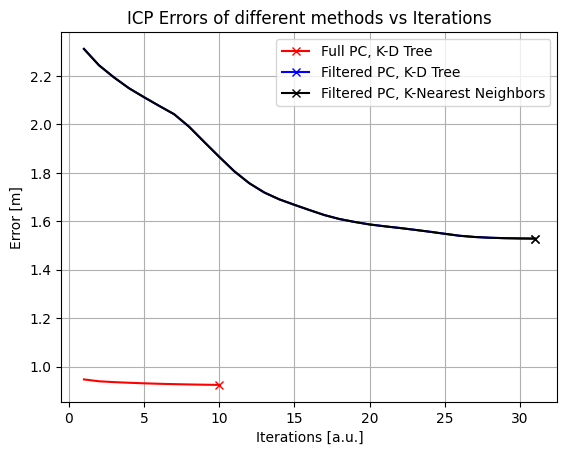

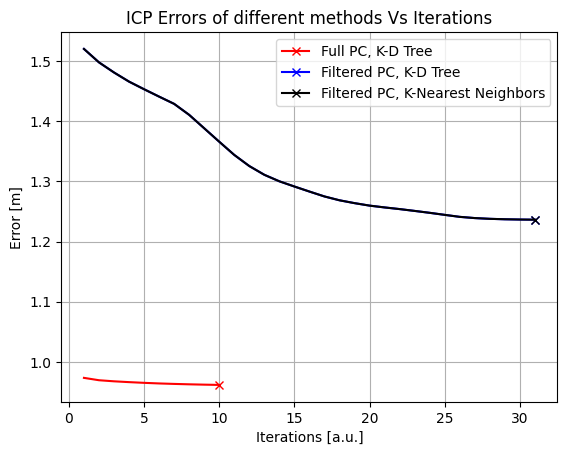

In [ ]:
# print final errors
print("Final error of K-D Tree is: {} [m^2]".format(errors_kd[-1]))
print("Final error of K-D Tree with filtered PC is: {} [m^2]".format(errors_kd_f[-1]))
print("Final error of K-Nearest Neighbors with filtered PC is: {} [m^2]".format(errors_knn[-1]))


# Time consuming
print("Elapsed time kdree: {:.4f} seconds".format(elapsed_time_kdree))
print("Elapsed time knn: {:.4f} seconds".format(elapsed_time_knn))


# compare errors on a graph
plt.figure()
plt.title("ICP Errors of different methods vs Iterations")
plt.plot(range(1,1+len(errors_kd)),errors_kd, '-rx', markevery=[len(errors_kd)-1], label='Full PC, K-D Tree')
plt.plot(range(1,1+len(errors_kd_f)), errors_kd_f, '-bx', markevery=[len(errors_kd_f)-1], label='Filtered PC, K-D Tree')
plt.plot(range(1,1+len(errors_knn)),errors_knn, '-kx', markevery=[len(errors_knn)-1], label='Filtered PC, K-Nearest Neighbors')
plt.xlabel("Iterations [a.u.]")
plt.ylabel("Error [m]")
plt.grid()
plt.legend()


# sqrt of errors
plt.figure()
plt.title("ICP Errors of different methods Vs Iterations")
plt.plot(range(1,1+len(errors_kd)),np.sqrt(errors_kd), '-rx', markevery=[len(errors_kd)-1], label='Full PC, K-D Tree')
plt.plot(range(1,1+len(errors_kd_f)), np.sqrt(errors_kd_f), '-bx', markevery=[len(errors_kd_f)-1], label='Filtered PC, K-D Tree')
plt.plot(range(1,1+len(errors_knn)),np.sqrt(errors_knn), '-kx', markevery=[len(errors_knn)-1], label='Filtered PC, K-Nearest Neighbors')
plt.xlabel("Iterations [a.u.]")
plt.ylabel("Error [m]")
plt.grid()
plt.legend()